In [33]:
import requests
import urllib
import json
import pandas as pd
import cv2
#from google.colab.patches import cv2_imshow

In [34]:
key = "db5c00dc1fce45c49049bff225a0fea6"

In [35]:
# url_cctv = f'https://openapi.its.go.kr:9443/cctvInfo?apiKey={key}&type=ex&cctvType=1&minX=126.756&maxX=126.7936&minY=37.48135&maxY=37.5843&getType=json'
# url_cctv = f"https://openapi.its.go.kr:9443/cctvInfo?apiKey={key}&type=its&cctvType=1&minX=126.5&maxX=127.5&minY=37.0&maxY=38.0&getType=json"
# url_cctv = f"https://openapi.its.go.kr:9443/cctvInfo?apiKey={key}&type=its&cctvType=1&minX=126.7&maxX=127.2&minY=37.3&maxY=37.7&getType=json"

# 서울 종로 중심(위도 경도 설정)
# url_cctv = f"https://openapi.its.go.kr:9443/cctvInfo?apiKey={key}&type=its&cctvType=1&minX=120.95&maxX=127.02&minY=30.55&maxY=37.60&getType=json"

# url_cctv = f"https://openapi.its.go.kr:9443/cctvInfo?apiKey={key}&type=its&cctvType=1&minX=126.8&maxX=127.2&minY=37.4&maxY=37.7&getType=json"
url_cctv = f"https://openapi.its.go.kr:9443/cctvInfo?apiKey={key}&type=&cctvType=1&minX=126.8&maxX=127.2&minY=37.4&maxY=37.7&getType=json"

In [36]:
response = urllib.request.urlopen(url_cctv)

In [37]:
json_str = response.read().decode("utf-8")

In [38]:
json_object = json.loads(json_str)

In [39]:
cctv_play = pd.json_normalize(json_object["response"]["data"], sep=',')

In [40]:
# 길이 ... 제한 해제
pd.set_option("display.max_rows", None)  # 모든 행 출력
pd.set_option("display.max_colwidth", None)  # 긴 문자열도 잘리지 않게 설정

In [41]:
# CCTV 링크 확인
print(cctv_play["cctvurl"])

0                              http://cctvsec.ktict.co.kr/1/jdwUt4iAo55wIajYtgzWV88UFpxrQXpYuUCvRVl6DotN1iMSNAEs7YmkWujEZUCy/yF5tF7Fw4Vlm+tEUHxZ6w==
1                              http://cctvsec.ktict.co.kr/2/bP55uGv8dXrSjI3BDpLHfqyAiQdmFl7zt6mF8uDRfhhXeIiwErpKdNf8UOWk9kD6/3CasStz0j2LxVzLlNL2CQ==
2                              http://cctvsec.ktict.co.kr/3/IkZYyFT+GD0UfMeDd2OPX/i0FY7cEzWdfaof5UNW2jBf9raszHSG7r+Svah99V5EIqizD7IH+rddHV9COSQcZQ==
3                              http://cctvsec.ktict.co.kr/4/LUIVbNjovc/0OBpX7AgnzhPUzxvzLfPhyV2m+DPo0z6RGEV8E3JWDgJXz4uXREq/elyvYVnadt7JlrwnwETXxQ==
4                              http://cctvsec.ktict.co.kr/5/fGgLrhVeTYmx9etjJKKgwxw8bYBVCJ9YW10qY7EF5IO3eEdWyF8wGTTcxYnh+yYoZKP4oGrnY2SzWjUwQENtHQ==
5                              http://cctvsec.ktict.co.kr/6/gAbwNRH0/dSkHrsLHNSf/4Fl1JePGJYlrGuFE5OaXJKbQemcJ1uboQLTcIdSw4g6yPxyfsAj9aISMnDDasEHaA==
6                              http://cctvsec.ktict.co.kr/7/WAcOBx6xHTIINsHLTZe06WEUk08Ls000C6umHDXxLIQe7E

In [42]:
# CCTV 설치명 확인
print(cctv_play["cctvname"])

0                       [수도권제1순환선] 판교분기점
1                          [수도권제1순환선] 성남
2                       [수도권제1순환선] 성남요금소
3                          [수도권제1순환선] 송파
4                        [수도권제1순환선] 서하남2
5                       [수도권제1순환선] 광암터널2
6                       [수도권제1순환선] 광암터널3
7                       [수도권제1순환선] 하남분기점
8                          [수도권제1순환선] 상일
9                          [수도권제1순환선] 강일
10                         [수도권제1순환선] 토평
11                        [수도권제1순환선] 남양주
12                        [수도권제1순환선] 퇴계원
13                         [수도권제1순환선] 구리
14                      [수도권제1순환선] 안현분기점
15                            [제2경인선] 광명
16                             [서해안선] 금천
17                          [서해안선] 금천고가교
18                          [서해안선] 일직분기점
19                            [서해안선] 광명역
20                              [경인선] 신월
21                         [수도권제1순환선] 일산
22                             [경부선] 상적교
23                           [경부선] 판교분기점
24              

In [43]:
test_url = cctv_play["cctvurl"][0]

In [44]:
cap = cv2.VideoCapture(test_url)

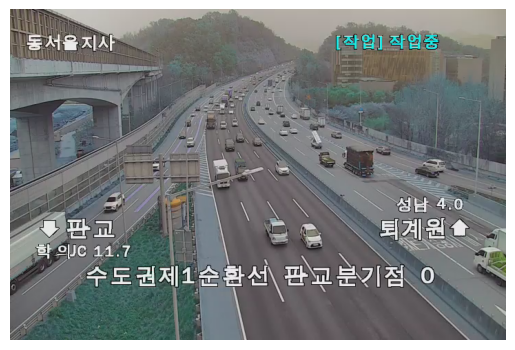

In [45]:
import matplotlib.pyplot as plt

cap = cv2.VideoCapture(test_url)  # CCTV 스트림 URL 입력

ret, frame = cap.read()
if ret:
    #cv2_imshow(frame)
    plt.imshow(frame)
    plt.axis("off")
else:
    print("프레임을 가져올 수 없습니다.")

cap.release()

100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:14<00:00,  6.69it/s]


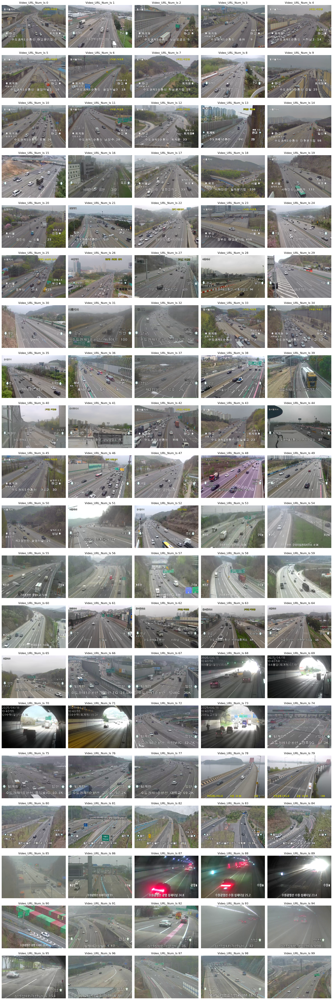

In [46]:
import cv2
import pandas as pd
import matplotlib.pyplot as plt
from tqdm import tqdm

# CCTV URL 리스트
test_url_list = cctv_play["cctvurl"]

# 최대 100개 프레임 수집
max_images = 100
frames = []
success_indices = []

for idx, url in tqdm(enumerate(test_url_list), total=max_images):
    if idx >= max_images:
        break

    cap = cv2.VideoCapture(url)
    if not cap.isOpened():
        print(f"[{idx}] ❌ Can't open: {url}")
        continue

    ret, frame = cap.read()
    cap.release()

    if ret:
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)  # OpenCV → RGB
        frames.append(frame)
        success_indices.append(idx)
    else:
        print(f"[{idx}] ⚠️ No frame from: {url}")

# 그리드로 출력
cols = 5
rows = (len(frames) + cols - 1) // cols
plt.figure(figsize=(20, rows * 3))

for i, frame in enumerate(frames):
    plt.subplot(rows, cols, i + 1)
    plt.imshow(frame)
    plt.title(f"Video_URL_Num_Is {success_indices[i]}")
    plt.axis("off")

plt.tight_layout()
plt.show()